In [1]:
import os
os.sys.path.append("../")
import numpy as np
import scipy as sp
from scipy import signal
import sklearn as sk
import preprocessing as pp
import utilities as u
from matplotlib import pyplot as plt
import pickle

import UnityTransforms as ut
import SimilarityMatrixAnalysis as sm
import itertools
import matplotlib.gridspec as gridspec

%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
df = pp.load_session_db(dir='D:\\')
# df = pp.load_session_db()
df = df[df['RewardCount']>40]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])
df = df[df["Track"]=="TwoTower_foraging"]
df = df[(df['ImagingRegion']=='CA1' )|(df['ImagingRegion']=='')]

In [3]:
mice = ['4139265.3','4139265.4','4139265.5','4222168.1','4343703.1','4343706','4222153.1','4222153.2',
        '4222153.3','4222174.1','4222154.1','4343702.1']
first_sessions = [5,5,5,3,5,2,4,4,4,4,4,4]
print(len(mice),len(first_sessions))
rare_mice,freq_mice = mice[:6],mice[6:]
rare_fs, freq_fs = first_sessions[:6],first_sessions[6:]


12 12


In [4]:
with open("D:\\Morph_Results\\rare_sf_regression.pkl",'rb') as f:
    rare_sfreg = pickle.load(f)
    
with open("D:\\Morph_Results\\freq_sf_regression.pkl",'rb') as f:
    freq_sfreg = pickle.load(f)

In [5]:
def prior_post(dict_sfreg,sigma_likelihood=.3,x=np.linspace(-.3,1.3,num=1000)[np.newaxis,:],first=True):
    mice = [mouse for mouse in dict_sfreg.keys()]
    priors,priors_uc = np.zeros([len(mice),x.shape[1]]),np.zeros([len(mice),x.shape[1]])
    for i, (mouse,res) in enumerate(dict_sfreg.items()):
        _prior,_prior_uc=res['priors'][0],res['priors_uc'][0]
        _prior = _prior/_prior.sum()
        priors[i,:]=_prior
        priors_uc[i,:]=_prior_uc/_prior_uc.sum()
        
    prior = _prior.mean(axis=0,keepdims=True)
    prior = prior/prior.sum()
    post = prior*u.gaussian(x.T,sigma_likelihood,x)
    post = post/post.sum(axis=1,keepdims=True)
    
    post_uc = prior*u.gaussian(ut.wallmorphx(x.T),sigma_likelihood,x)
    post_uc = post_uc/post_uc.sum(axis=1,keepdims=True)
    return priors, prior, post,priors_uc, post_uc

In [6]:
rare_priors,rare_prior,rare_post , rare_prior_uc,rare_post_uc= prior_post(rare_sfreg,first=True)
freq_priors,freq_prior,freq_post, freq_prior_uc , freq_post_uc= prior_post(freq_sfreg,first=True)
x = np.linspace(-.3,1.3,num=1000)

In [7]:
def single_session_kldiv(_wm,_yh):
    
    wmsm = u.gaussian(_wm[:,np.newaxis,np.newaxis],.1,x[np.newaxis,:,np.newaxis])
    yhsm = u.gaussian(_yh[:,np.newaxis,np.newaxis],.1,x[np.newaxis,np.newaxis,:])
    H = np.sum(wmsm*yhsm,axis=0)
    Z=H.sum(axis=1)
    H/=H.sum(axis=1,keepdims=True)
    xmask = (x>=-.1) & (x<=1.1)
    rare_kl,freq_kl = [],[]
    for row in range(H.shape[1]):
        if (x[row]>=.1) and (x[row]<=1.1):
            rare_kl.append(sp.stats.entropy(rare_post[row,:],H[row,:],base=2))
            freq_kl.append(sp.stats.entropy(freq_post[row,:],H[row,:],base=2))
    return H[xmask,:].T, np.array(rare_kl).mean()-np.array(freq_kl).mean()

        

In [8]:
def plot_sessions(mouse,df,sessions,sessionlabels):
    df_mouse = df[df["MouseName"]==mouse]
    f = plt.figure(figsize=[25,7*len(sessions)])
    gs = gridspec.GridSpec(14*len(sessions),50)
    
    
    for i,(ind,label) in enumerate(zip(sessions,sessionlabels)):
        sess=df_mouse.iloc[ind]
        with open(os.path.join("D:\\Suite2P_Data\\",sess["MouseName"],"%s_%s_%i.pkl" % (sess["Track"],sess["DateFolder"],sess["SessionNumber"])),'rb') as ff:
                    data = pickle.load(ff)
        VRDat,S = data['VRDat'],data['S']
        S[np.isnan(S)]=0
        S = S/np.percentile(S,95,axis=0)
        trial_info,S_trial_mat= data['trial_info'],data['S_trial_mat']
        morphs = trial_info['morphs']+trial_info['wallJitter']
        effMorph = (trial_info['morphs']+trial_info['wallJitter']+.1)/1.2
        S_trial_mat[np.isnan(S_trial_mat)]=0
        
        
        # trial x trial similarity
        S_tmat_norm = np.copy(S_trial_mat).reshape(S_trial_mat.shape[0],-1)
        S_tmat_norm = S_tmat_norm/np.linalg.norm(S_tmat_norm,ord=2,axis=-1,keepdims=True)
        C = np.matmul(S_tmat_norm,S_tmat_norm.T)
        
        msort = np.argsort(morphs)
        C_msort = sm._sort_simmat(C,msort)
        
        vmax = np.percentile(C.ravel(),90)
        vmin = np.percentile(C.ravel(),10)

        cm_ax = f.add_subplot(gs[14*i:14*i+9,:9])
        cm_ax.imshow(C_msort,cmap='Greys',vmin=vmin,vmax=vmax,aspect='auto')
        cm_ax.set_yticks([])
        cm_ax.set_xticks([])
        cm_ax.set_title("%s, session %d (%d neurons, %d trials)" % (mouse, label,S.shape[1],morphs.shape[0]),fontsize=20)

        mm_ax = f.add_subplot(gs[14*i+9:14*i+12,:9])
        mm_ax.scatter(np.arange(effMorph.size),effMorph[msort],c=1-effMorph[msort],cmap='cool')
        mm_ax.set_ylabel("S",fontsize=20)
        mm_ax.set_xlim([0,effMorph.size])
        mm_ax.set_yticks([])
        mm_ax.set_yticks([])
        
        
         
        rtsf = u.rt_similarity_fraction(S_trial_mat,trial_info)
        rtsf_ax = f.add_subplot(gs[14*i+2:14*i+12,10:18])
        for t in range(rtsf.shape[0]):
            rtsf_ax.plot(np.arange(5,450,10),rtsf[t,:],alpha=.3,c=plt.cm.cool(1-effMorph[t]))
        rtsf_ax.spines['top'].set_visible(False)
        rtsf_ax.spines['right'].set_visible(False)
        rtsf_ax.set_ylim([np.nanmax(rtsf.ravel())+.1,np.nanmin(rtsf.ravel())-.1])
        rtsf_ax.set_xlabel("Position (cm.)",fontsize=15)
        rtsf_ax.set_ylabel("$SF$",fontsize=15)
        

   
          # similarity fraction
        sf = u.similarity_fraction(S_trial_mat,trial_info)
        sf_ax = f.add_subplot(gs[14*i+2:14*i+12,20:28])
        sf_ax.scatter(ut.xfreq(morphs),sf,color='black') #,c=plt.cm.cool(1-effMorph))
        sf_ax.set_ylim([np.amax(sf)+.1,np.amin(sf)-.1])
        sf_ax.spines['top'].set_visible(False)
        sf_ax.spines['right'].set_visible(False)
        sf_ax.set_xlabel("$f_h$",fontsize=15)
        sf_ax.set_ylabel("$SF$",fontsize=15)
        
        
        
       
        yhat = (sf- np.median(sf[trial_info['morphs']==0]))/(np.median(sf[trial_info['morphs']==1])-np.median(sf[trial_info['morphs']==0]))*(1.073-.094) +.094 
        yhat = np.clip(yhat,-.3,1.3)
        H,dkl = single_session_kldiv(ut.wallmorphx(morphs),yhat)
        
        h_ax = f.add_subplot(gs[14*i+2:14*i+12,30:38])
        h_ax.imshow(H,cmap='RdPu',extent=[ut.inv_wallmorphx(-.1),ut.inv_wallmorphx(1.1),ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
        h_ax.set_title("$\Delta D_{KL}$ = %.4f" % (dkl),fontsize=15)
        h_ax.set_xlabel("$\hat{f}_h$", fontsize=15)
        h_ax.set_ylabel("$f_h$",fontsize=15)
        
        e_ax = f.add_subplot(gs[14*i+2:14*i+12,40:48])
        [w,V]=np.linalg.eig(C)
        order = np.argsort(w)[::-1]
        w = w[order]
        V=V[:,order]
        # project trials onto top 3 eigenvectors
        X =  np.matmul(C,V[:,:3])

        e_ax.scatter(X[:,0],X[:,1],c=1-effMorph,cmap='cool',marker='o',s=150)
        e_ax.spines['top'].set_visible(False)
        e_ax.spines['right'].set_visible(False)
        
        
                                
    return f

4139265.3
4139265.4
4139265.5
4222168.1


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


4343703.1
4343706
4222153.1
4222153.2
4222153.3
4222174.1
4222154.1
4343702.1


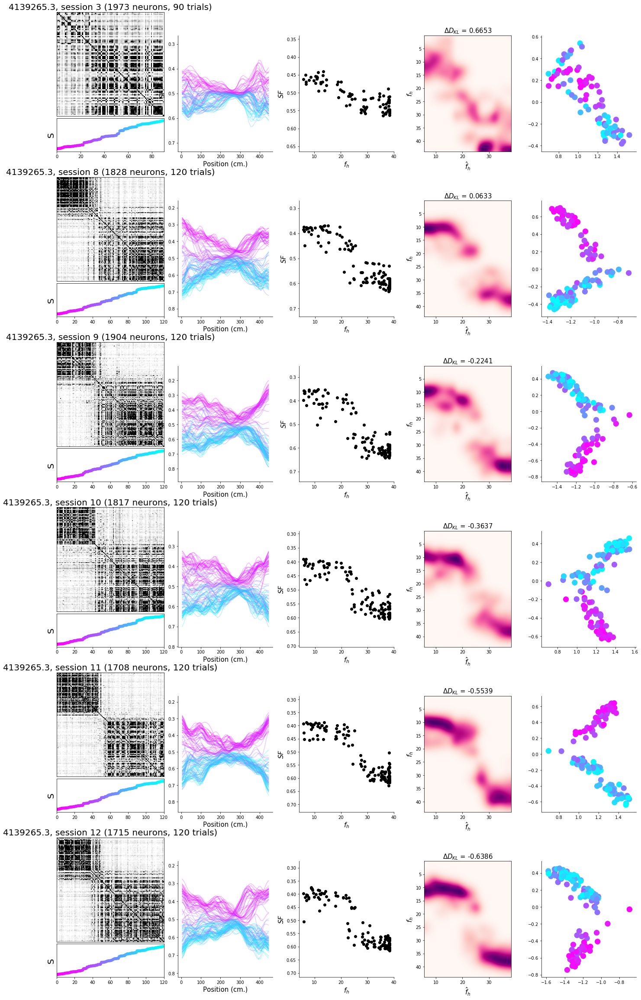

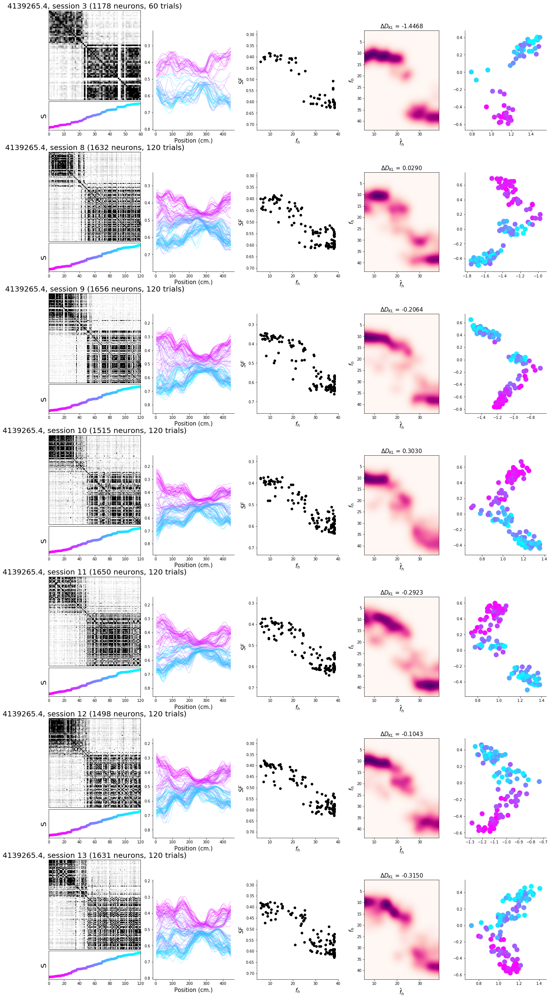

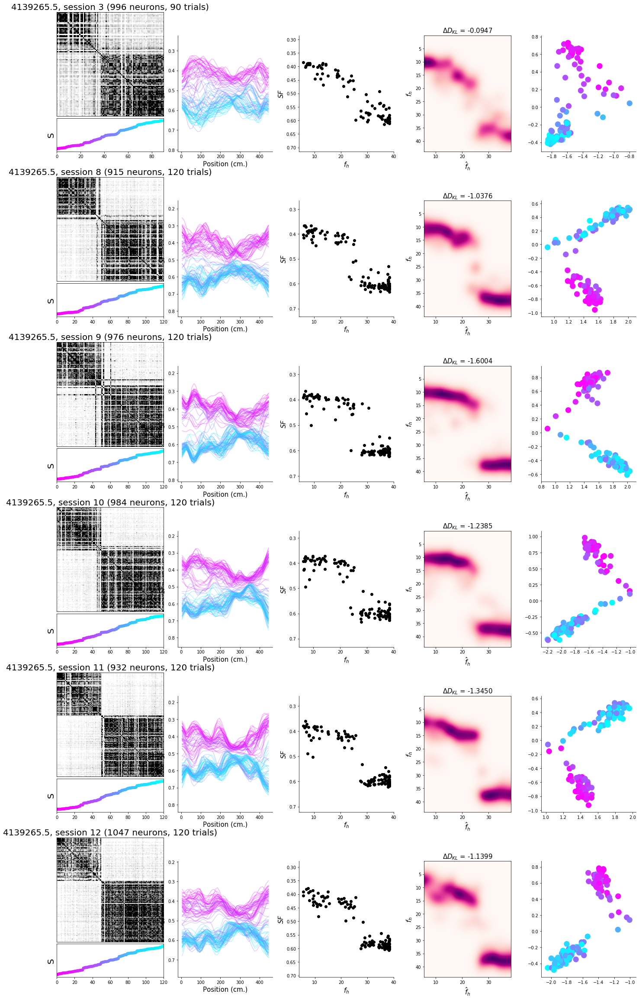

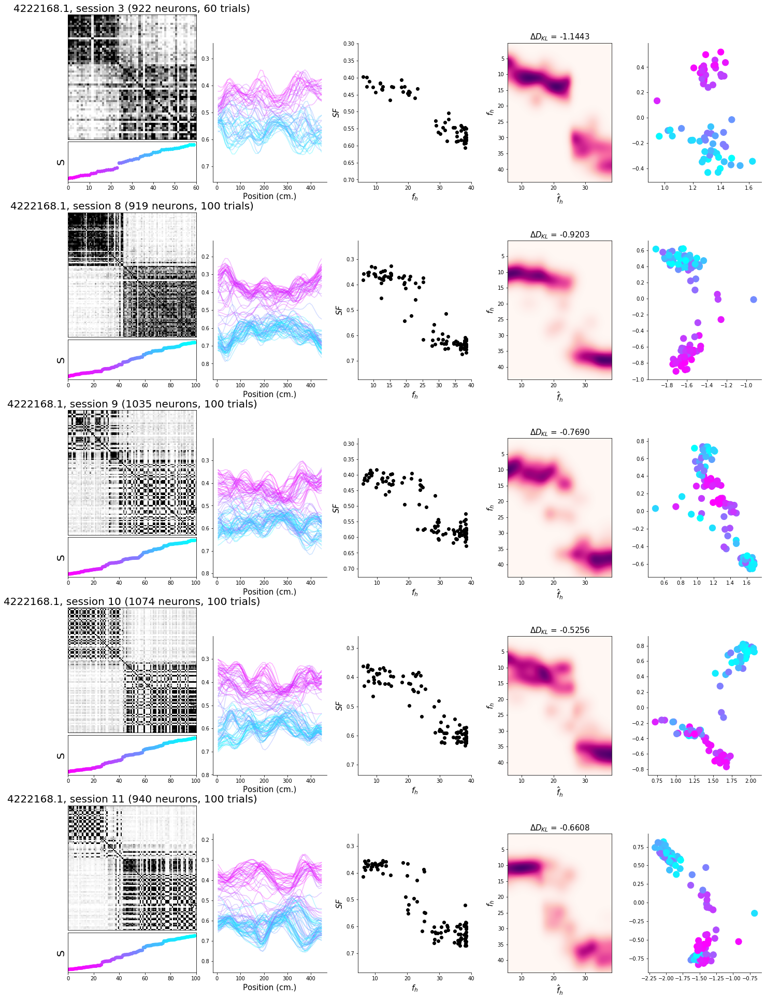

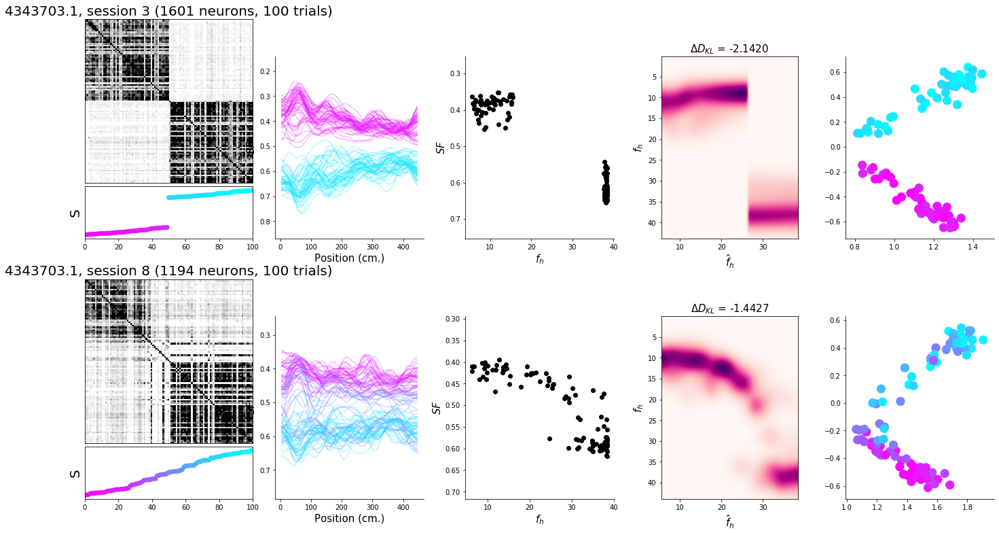

...

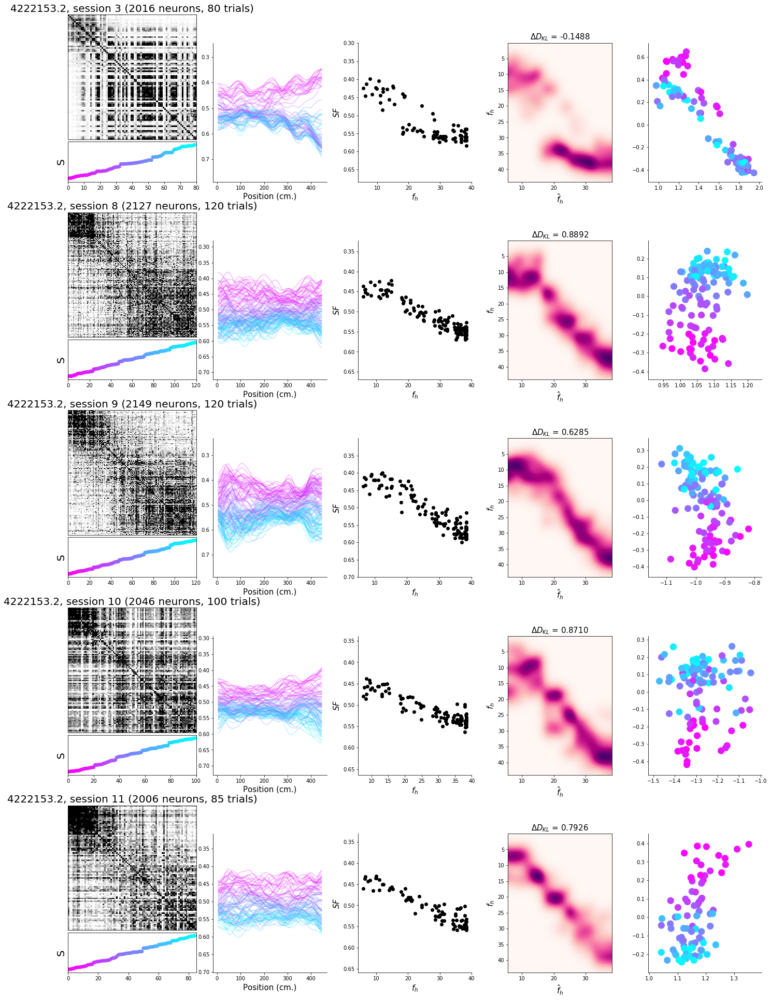

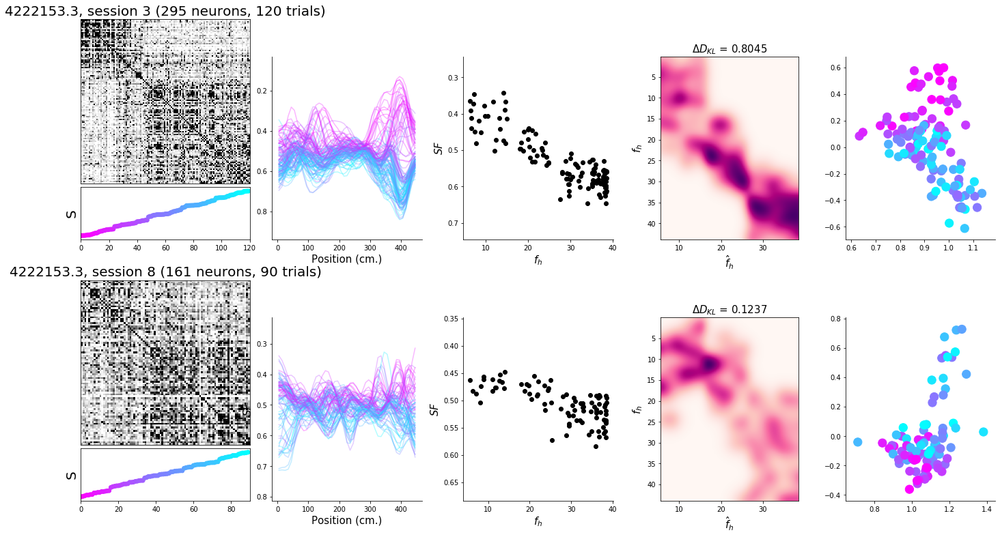

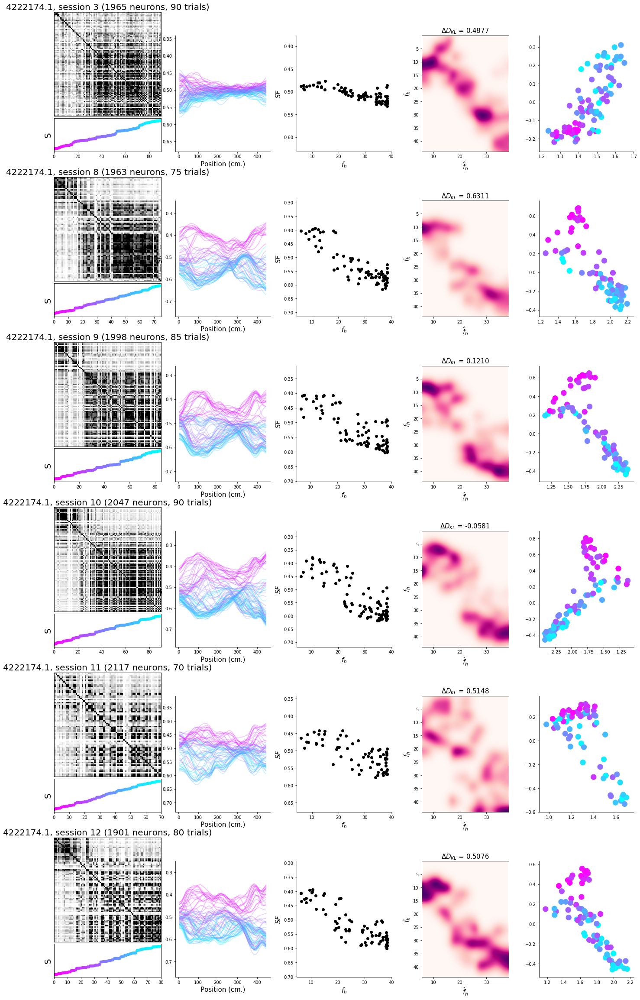

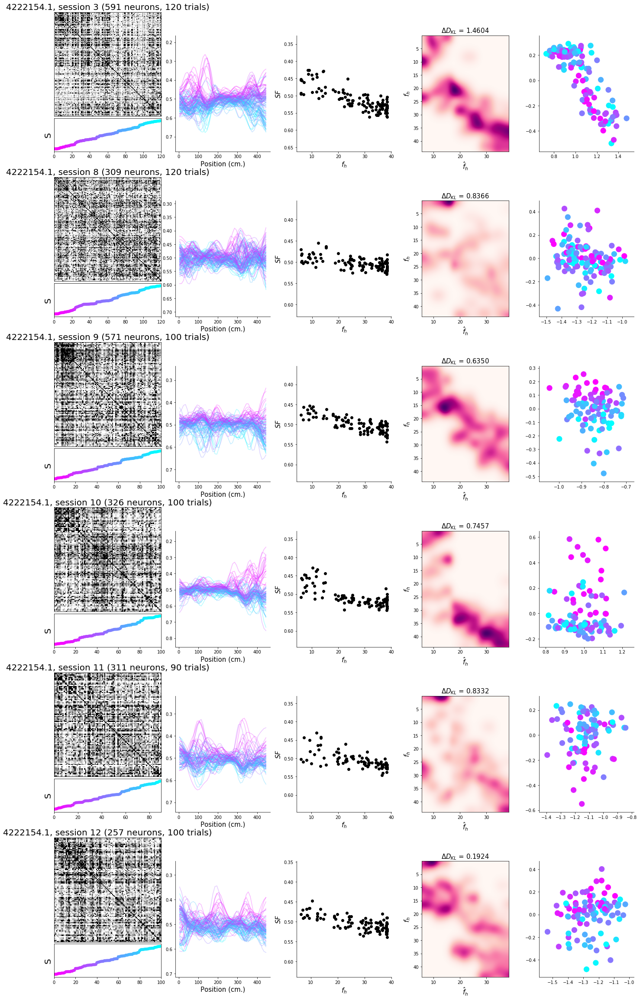

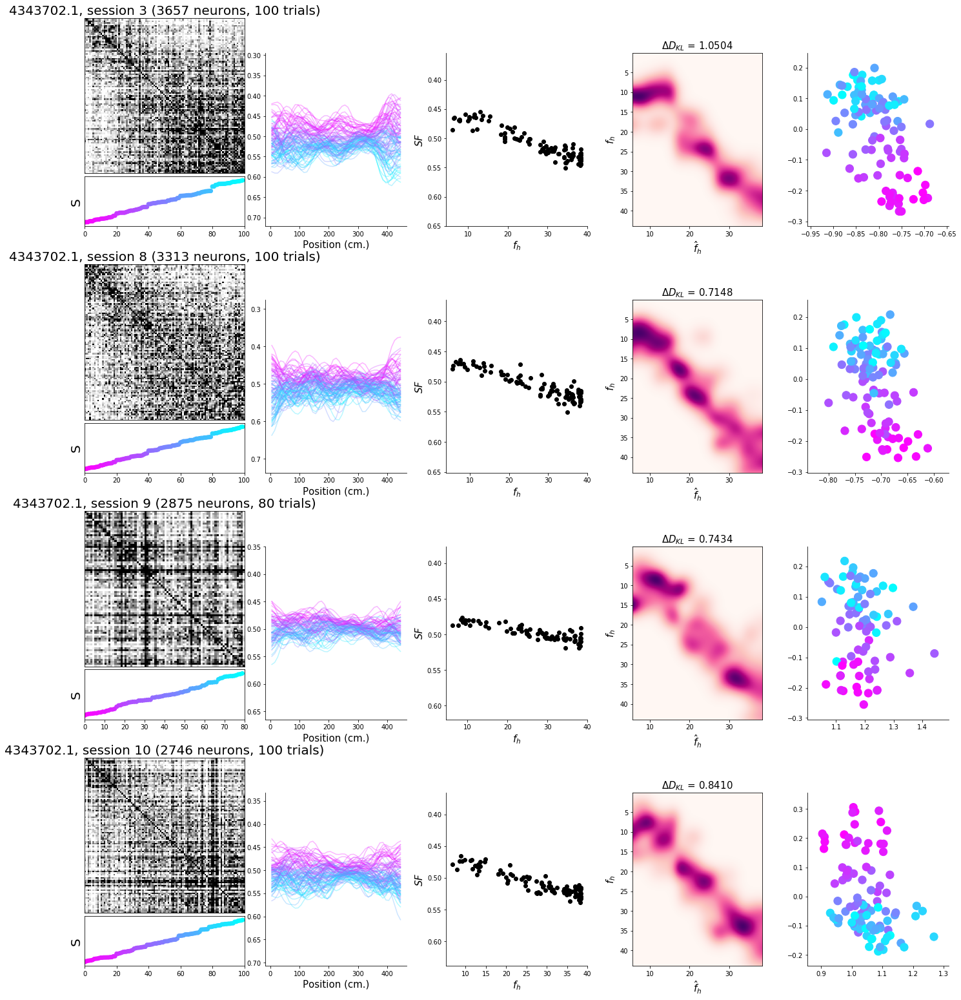

In [9]:

for m,mouse in enumerate(mice):
    print(mouse)
    df_mouse = df[df["MouseName"]==mouse]
    if mouse != '4343706':
        sessnum = np.append([first_sessions[m]-3],np.arange(first_sessions[m],df_mouse.shape[0]))
    else:
        sessnum = np.arange(first_sessions[m],df_mouse.shape[0])
    
    sesslabels = np.copy(sessnum)
    if mouse in rare_mice:
        if mouse == "4343706":
            
            sesslabels+=6
        elif mouse== '4222168.1':
            sesslabels[0]+=3
            sesslabels[1:]+=5
        else:
            sesslabels[0]+=1
            sesslabels[1:]+=3
    else:
        sesslabels[0]+=2
        sesslabels[1:]+=4
    

    f=plot_sessions(mouse,df,sessnum.tolist(),sesslabels.tolist())
    f.savefig(os.path.join("D:\\Morph_Results\\figures\\AllSessionsPlots","%s.pdf" % mouse),format="pdf")
    

In [10]:
mouse = '4343703.1'
df_mouse = df[df["MouseName"]==mouse]
sessnum = [1,5]
sesslabels = [3,8]
f=plot_sessions(mouse,sessnum,sesslabels)
f.savefig(os.path.join("D:\\Morph_Results\\figures\\AllSessionsPlots","%s.pdf" % mouse),format="pdf")

TypeError: plot_sessions() missing 1 required positional argument: 'sessionlabels'

In [ ]:
mouse = "4343706"
df_mouse = df[df["MouseName"]==mouse]
sessnum = np.arange(2,df_mouse.shape[0])
sesslabels = np.copy(sessnum)
sesslabels+=6
f=plot_sessions(mouse,sessnum,sesslabels)
f.savefig(os.path.join("D:\\Morph_Results\\figures\\AllSessionsPlots","%s.pdf" % mouse),format="pdf")

In [13]:
dff = pp.load_session_db(dir='D:\\')
dff = dff[dff['RewardCount']>30]
dff = dff[dff['Imaging']==1]
dff = dff.sort_values(['MouseName','DateTime','SessionNumber'])

tracks = 'FreqMorph_Decision|FreqMorph_Timeout|TwoTower_noTimeout|TwoTower_Timeout'
dff = dff[dff['Track'].str.contains(tracks,regex=True)]
fd_mice = '4222157.4|4222169.1|4222169.2|4222169.4'
dff = dff[dff['MouseName'].str.contains(fd_mice,regex=True)]
fd_mice = ['4222157.4','4222169.1','4222169.2','4222169.4']

In [14]:
dff[dff["MouseName"]=='4222157.4']

,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,ImagingRegion,DateTime,data file,scanmat,s2pfolder
1999,4222157.4,04_06_2019,0,FreqMorph_Decision,100,1,CA1,2019-06-04,D:\VR_Data\TwoTower\4222157.4\04_06_2019\FreqM...,None,None
2030,4222157.4,06_06_2019,1,FreqMorph_Decision,99,1,CA1,2019-06-06,D:\VR_Data\TwoTower\4222157.4\06_06_2019\FreqM...,None,None
2079,4222157.4,11_06_2019,1,FreqMorph_Timeout,71,1,CA1,2019-06-11,D:\VR_Data\TwoTower\4222157.4\11_06_2019\FreqM...,None,None
2101,4222157.4,13_06_2019,1,FreqMorph_Timeout,76,1,CA1,2019-06-13,D:\VR_Data\TwoTower\4222157.4\13_06_2019\FreqM...,None,None
2114,4222157.4,14_06_2019,2,FreqMorph_Timeout,66,1,CA1,2019-06-14,D:\VR_Data\TwoTower\4222157.4\14_06_2019\FreqM...,None,None
2128,4222157.4,15_06_2019,1,FreqMorph_Timeout,70,1,CA1,2019-06-15,D:\VR_Data\TwoTower\4222157.4\15_06_2019\FreqM...,None,None
2137,4222157.4,17_06_2019,1,FreqMorph_Timeout,78,1,CA1,2019-06-17,D:\VR_Data\TwoTower\4222157.4\17_06_2019\FreqM...,None,None
2155,4222157.4,18_06_2019,1,FreqMorph_Timeout,87,1,CA1,2019-06-18,D:\VR_Data\TwoTower\4222157.4\18_06_2019\FreqM...,None,None
2166,4222157.4,19_06_2019,1,FreqMorph_Timeout,85,1,CA1,2019-06-19,D:\VR_Data\TwoTower\4222157.4\19_06_2019\FreqM...,None,None
2198,4222157.4,23_06_2019,1,TwoTower_Timeout,84,1,CA1,2019-06-23,D:\VR_Data\TwoTower\4222157.4\23_06_2019\TwoTo...,None,None


4222157.4


..\utilities.py:68: RuntimeWarning: invalid value encountered in true_divide
  S_tmat_norm = S_trial_mat/np.linalg.norm(S_trial_mat,ord=2,axis=-1,keepdims=True)


4222169.1
4222169.2
4222169.4


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


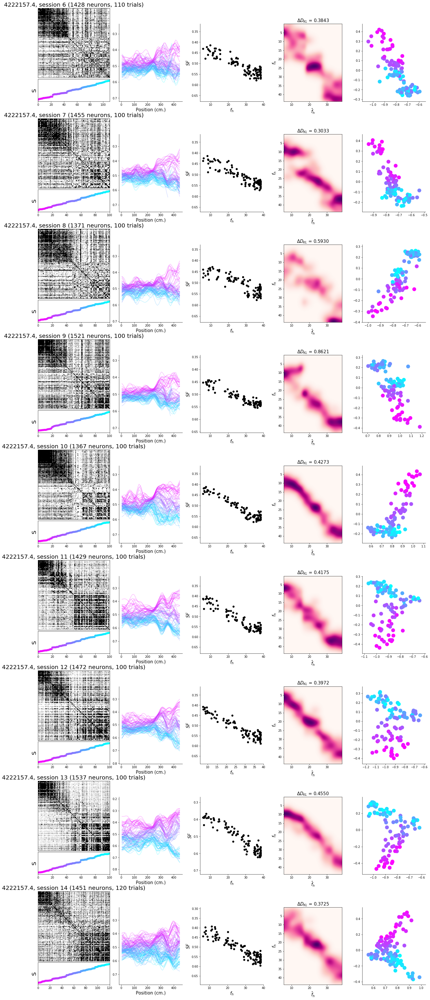

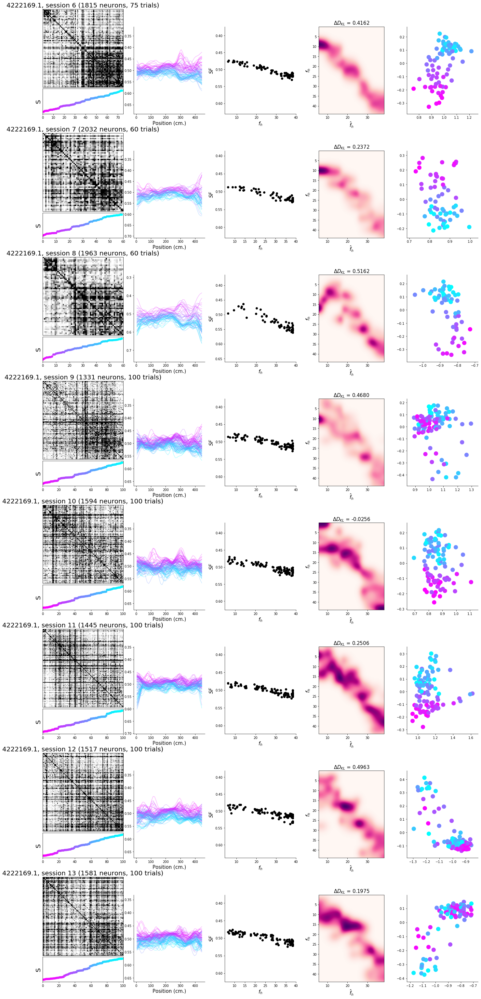

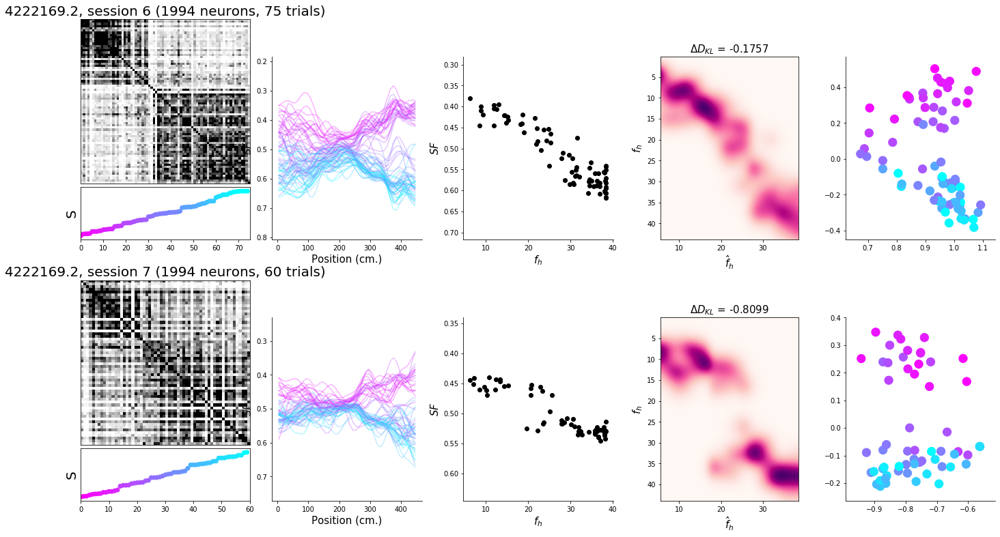

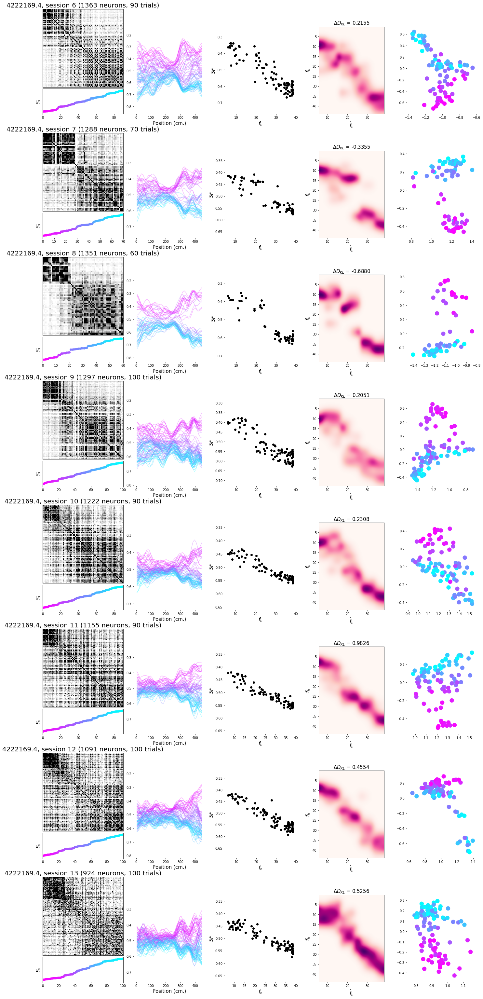

In [15]:
for m,mouse in enumerate(fd_mice):
    print(mouse)
    dff_mouse = dff[dff["MouseName"]==mouse]
    sessnum = np.arange(2,dff_mouse.shape[0])
    
    
    sesslabels = np.copy(sessnum)
    sesslabels+=4
    

    f=plot_sessions(mouse,dff,sessnum.tolist(),sesslabels.tolist())
    f.savefig(os.path.join("D:\\Morph_Results\\figures\\AllSessionsPlots","%s.pdf" % mouse),format="pdf")